## Lab02 - Image Processing and Analysis
**Full name:** Đinh Anh Huy - 
**ID Student:** 18110103

In [1]:
import numpy as np
import math
import pandas as pd
import cv2
from matplotlib import pyplot as plt
from pylab import imread
from skimage.color import rgb2gray

from skimage import feature, filters
from skimage.color.adapt_rgb import adapt_rgb, each_channel, hsv_value
from skimage.exposure import rescale_intensity
from skimage.transform import rotate
from skimage import util
from skimage import exposure

In [2]:
def imshows(ImageData, LabelData, rows, cols, gridType = False):
    # Convert ImageData and LabelData to List
    from matplotlib import pyplot as plt
    ImageArray = list(ImageData)
    LabelArray = list(LabelData)
    if(rows == 1 & cols == 1):
        fig = plt.figure(figsize=(20,20))
    else:
        fig = plt.figure(figsize=(cols*8,rows*5))
        
    for i in range(1, cols * rows + 1):
        fig.add_subplot(rows, cols, i)
        image = ImageArray[i - 1]
        # If the channel number is less than 3, we display as grayscale image
        # otherwise, we display as color image
        if (len(image.shape) < 3):
            plt.imshow(image, plt.cm.gray)
            plt.grid(gridType)
        else:
            plt.imshow(image)
            plt.grid(gridType)
        plt.title(LabelArray[i - 1])
    plt.show()
def ShowThreeImages(IM1, IM2, IM3):
    imshows([IM1, IM2, IM3], ["Image 1","Image 2", "Image 3"], 1, 3)
def ShowTwoImages(IM1, IM2):
    imshows([IM1, IM2], ["Image 1","Image 2"], 1, 2)
def ShowOneImage(IM):
    imshows([IM], ["Image"], 1, 1)
def ShowListImages(listImage, row, col):
    listCaption = []
    for i in range(len(listImage)):
        listCaption.append(str(i))
    imshows(listImage,listCaption,row,col)

In [3]:
def read_image(img_name):
    img_color = imread(img_name)
    img_gray = cv2.cvtColor(img_color, cv2.COLOR_RGB2GRAY)
    img_hsv = cv2.cvtColor(img_color, cv2.COLOR_BGR2HSV)
    return (img_color, img_gray, img_hsv)

## Bài tập 1
**Chọn 1 ảnh từ internet bất kỳ và thực hiện các thao tác sau**

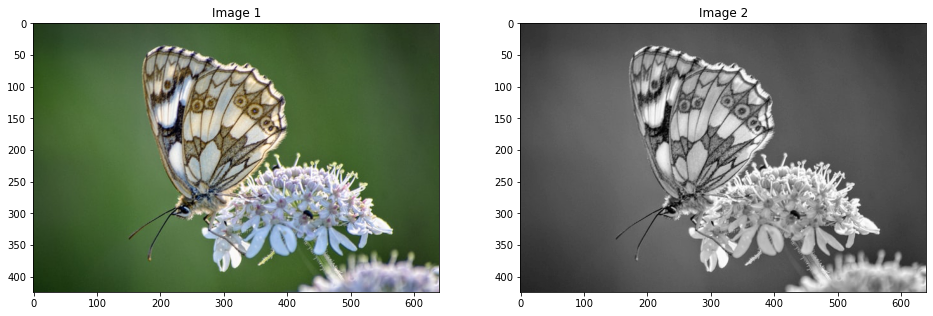

In [4]:
# Read Image
image_color, image_gray, image_hsv = read_image("butterfly2.jpg")
# Display Image
ShowTwoImages(image_color, image_gray)

**Viết thành một function cho biết thông tin của bức ảnh**
* Ảnh màu hay xám.
* Giá trị min, max tương ứng với cùng kênh màu.

In [5]:
def ShowInfor(src_img):
    height, width = src_img.shape[:2]
    channel = len(src_img.shape)
    print("Width : {}".format(width), "- Height : {}".format(height), "- Channel : {}".format(channel))
    if(channel == 2):
        print("Min Intensity: \t{}".format(src_img.min()), "- Max Intensity: \t{}".format(src_img.max()))
    else:
        print("Red - Min Intensity: \t{},".format(src_img[:,:,0].min()), " Max Intensity: \t{}".format(src_img[:,:,0].max()))
        print("Green - Min Intensity: \t{},".format(src_img[:,:,1].min()), " Max Intensity: \t{}".format(src_img[:,:,1].max()))
        print("Blue - Min Intensity: \t{},".format(src_img[:,:,2].min()), " Max Intensity: \t{}".format(src_img[:,:,2].max()))

In [6]:
# Show Information of Color Image
ShowInfor(image_color)

Width : 640 - Height : 424 - Channel : 3
Red - Min Intensity: 	0,  Max Intensity: 	255
Green - Min Intensity: 	0,  Max Intensity: 	255
Blue - Min Intensity: 	0,  Max Intensity: 	255


In [7]:
# Show Information of Gray Image
ShowInfor(image_gray)

Width : 640 - Height : 424 - Channel : 2
Min Intensity: 	0 - Max Intensity: 	255


**Hiển thị 24 bức ảnh theo bit của từng kênh mày R, G, B**

Mỗi kênh 8 ảnh x 3 kênh = 24 ảnh bit

In [8]:
def intToBitArray(img) :
    row ,col = img.shape[:2]
    list = []
    for i in range(row):
        for j in range(col):
            list.append(np.binary_repr(img[i][j] ,width=8))
            '''the binary_repr() fucntion returns binary values 
            but in string, not integer, 
            which has it's own perk as you will notice''' 
    return list 

def bitplane(bitImgVal, img1D):
    bitList = [int(i[bitImgVal]) for i in img1D]
    return bitList

def GetBitImage(index, image2D):
    ImageIn1D = intToBitArray(image2D)
    Imagebit = np.array(bitplane(index, ImageIn1D))
    Imagebit = np.reshape(Imagebit, image2D.shape)
    return Imagebit

def GetAllBitImage(image2D):
    image2D_Bit = list()
    for i in range(8):
        image2D_Bit.append(GetBitImage(i, image2D))
    return image2D_Bit

List have  24  images


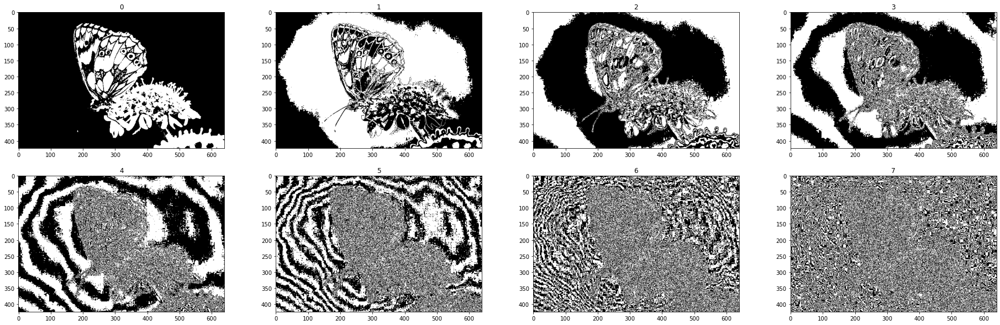

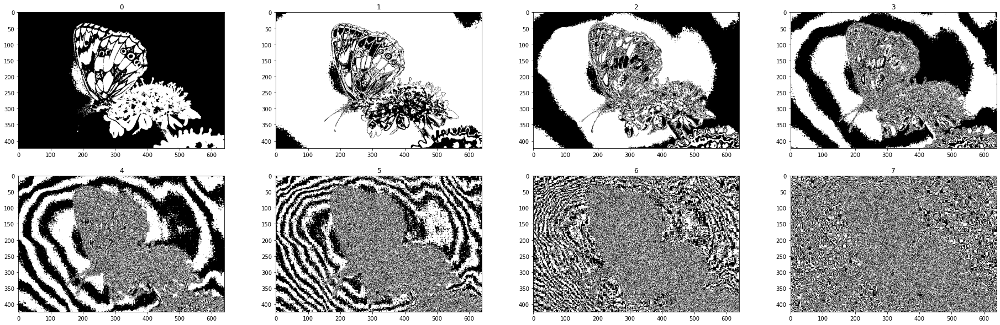

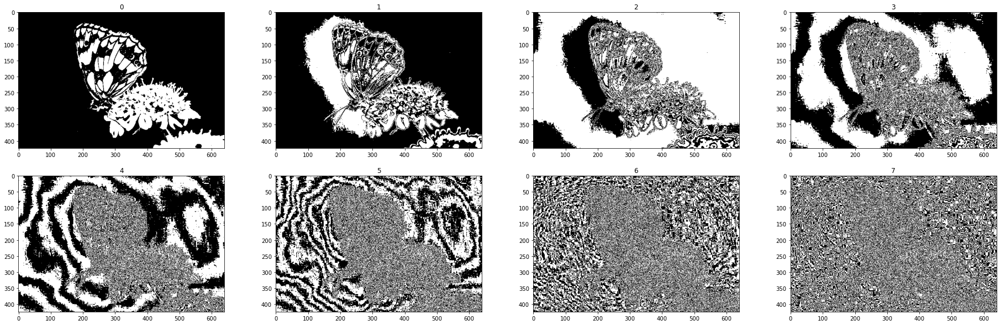

In [9]:
# Get 8 Mask Image corresponding to 8 bit of each channel of color image
image2D_Bit_Red = GetAllBitImage(image_color[:, :, 0])
image2D_Bit_Green = GetAllBitImage(image_color[:, :, 1])
image2D_Bit_Blue = GetAllBitImage(image_color[:, :, 2])

print("List have ", len(image2D_Bit_Red)+len(image2D_Bit_Green)+len(image2D_Bit_Blue), " images")
ShowListImages(image2D_Bit_Red, 2, 4)
ShowListImages(image2D_Bit_Green, 2, 4)
ShowListImages(image2D_Bit_Blue, 2, 4)

**Hiển thị 24 bức ảnh theo bit của từng kênh màu H, S, V**

Mỗi kênh 8 ảnh x 3 kênh = 24 ảnh bit

List have  24  images


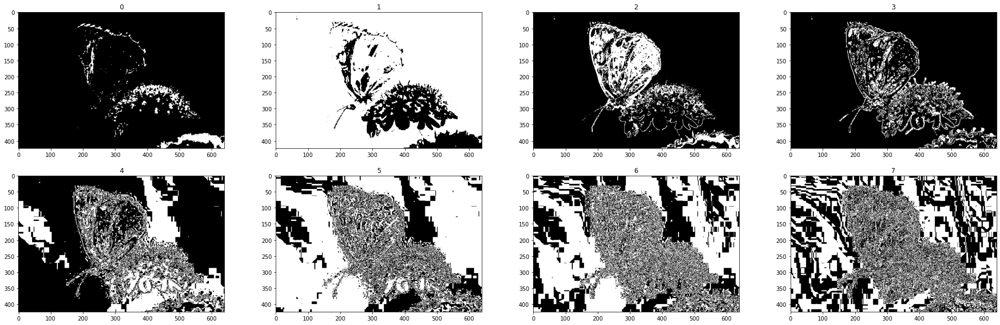

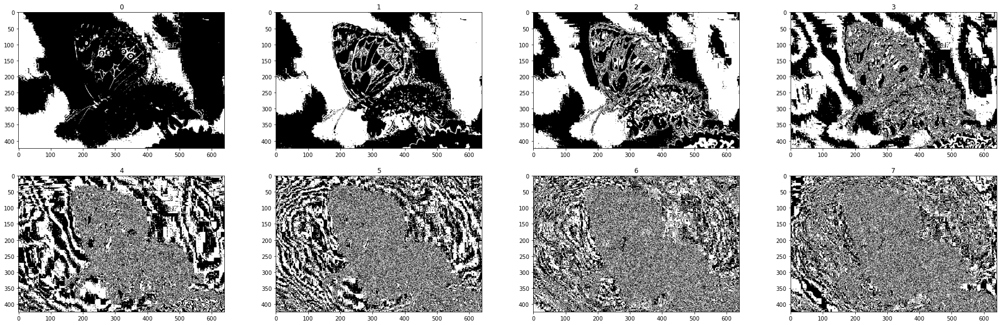

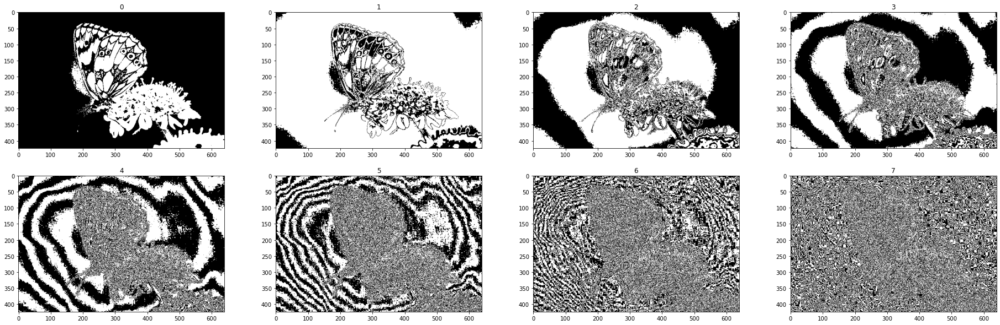

In [10]:
# Get 8 Mask Image corresponding to 8 bit of each channel of hsv image
image2D_Bit_H = GetAllBitImage(image_hsv[:, :, 0])
image2D_Bit_S = GetAllBitImage(image_hsv[:, :, 1])
image2D_Bit_V = GetAllBitImage(image_hsv[:, :, 2])

print("List have ", len(image2D_Bit_H)+len(image2D_Bit_S)+len(image2D_Bit_V), " images")
ShowListImages(image2D_Bit_H, 2, 4)
ShowListImages(image2D_Bit_S, 2, 4)
ShowListImages(image2D_Bit_V, 2, 4)

**Cho biết trong 24 ảnh bit theo kênh R, G, B có ảnh nào có thể dùng để trích xuất đối tượng hay không. Nếu có thì hiển thị ảnh bit đó ra.**

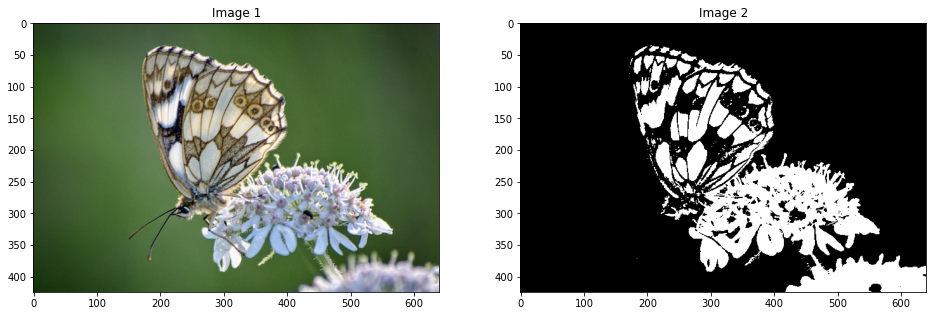

In [11]:
# Take the highest bit image
CellMask01 = image2D_Bit_Blue[0]
ShowTwoImages(image_color, CellMask01)

**Cho biết trong 24 ảnh bit theo kênh H, S, V có ảnh nào có thể dùng để trích xuất đối tượng hay không. Nếu có thì hiển thị ảnh bit đó ra.**

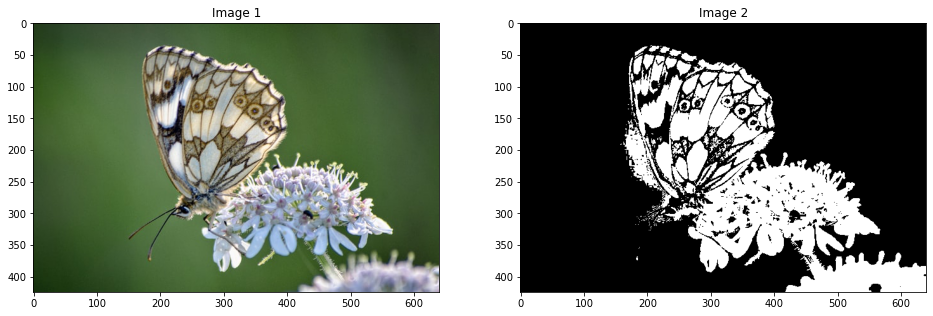

In [12]:
# Take the highest bit image
CellMask02 = image2D_Bit_V[0]
ShowTwoImages(image_color, CellMask02)

**Tìm chọn range màu lower và upper để trích xuất được đối tượng trong ảnh màu.**

In [13]:
def SegmentColorImageByMask(IM, Mask):
    Mask = Mask.astype(np.uint8)
    result = cv2.bitwise_and(IM, IM, mask = Mask)
    return result

def get_color_in_range(src_img, lower, upper):
    lower = np.array(lower)
    upper = np.array(upper)
    CellMask = cv2.inRange(src_img, lower, upper)
    return SegmentColorImageByMask(src_img, CellMask)

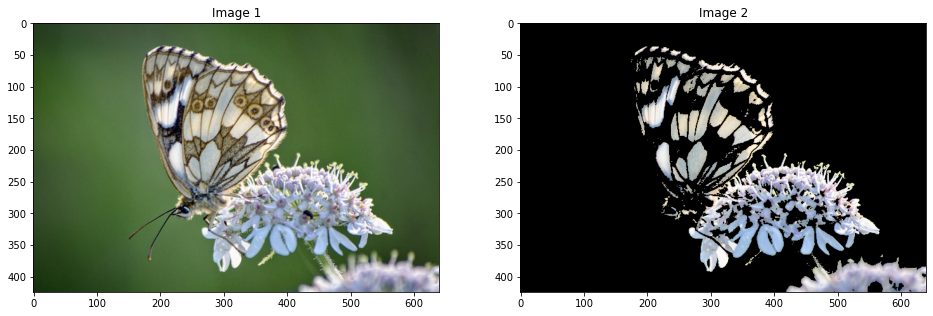

In [14]:
lower = [0, 0, 150]
upper = [255, 255, 255]
ShowTwoImages(image_color, get_color_in_range(image_color, lower, upper))

**Trích xuất đối tượng từ ảnh màu**

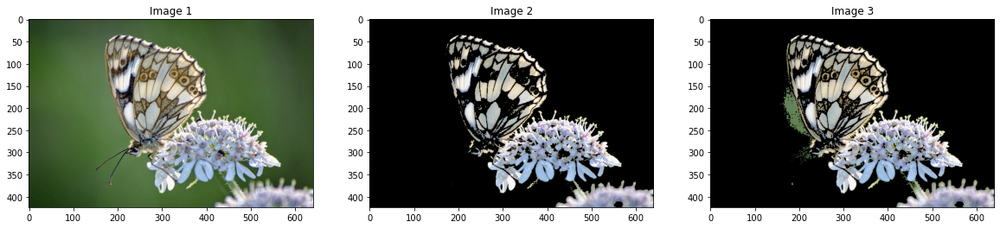

In [15]:
CellMask01_rgb = SegmentColorImageByMask(image_color, CellMask01)
CellMask02_hsv = SegmentColorImageByMask(image_color, CellMask02)
ShowThreeImages(image_color, CellMask01_rgb, CellMask02_hsv)

## Bài tập 2
**Chọn một bức ảnh có nhiều mặt người trên internet và thực hiện các thao tác sau**

**Viết 1 function input ảnh màu và xuất ảnh chân dung xám và chân dùng màu của ảnh đó.**

In [16]:
@adapt_rgb(each_channel)
def sobel_each(image):
    return filters.sobel(image)

@adapt_rgb(hsv_value)
def sobel_hsv(image):
    return filters.sobel(image)

def edge_detection_gray(src_img, filter='sobel'):
    image_gray = cv2.cvtColor(src_img, cv2.COLOR_RGB2GRAY)
    edges = {'canny': feature.canny(image_gray), 
             'sobel': filters.sobel(image_gray),
             'laplace': filters.laplace(image_gray),
             'scharr': filters.scharr(image_gray),
             'prewitt': filters.prewitt(image_gray),
             'roberts': filters.roberts(image_gray)}
    return 1 - edges[filter]
    
def edge_detection_color(src_img):
    image_sobel_rgb = rescale_intensity(1 - sobel_each(src_img))
    image_sobel_hsv = rescale_intensity(1 - sobel_hsv(src_img))
    return (image_sobel_rgb, image_sobel_hsv)

Image Size: (427, 640, 3)


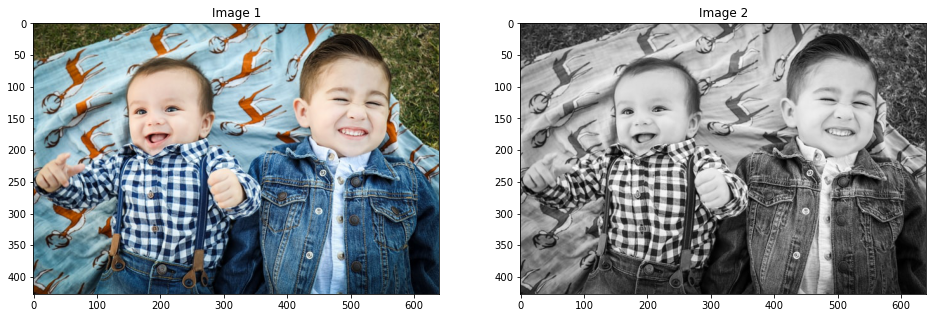

In [17]:
# Read Image
image_color, image_gray = read_image("children3.jpg")[:2]
# Display Image
print("Image Size:", image_color.shape)
ShowTwoImages(image_color, image_gray)

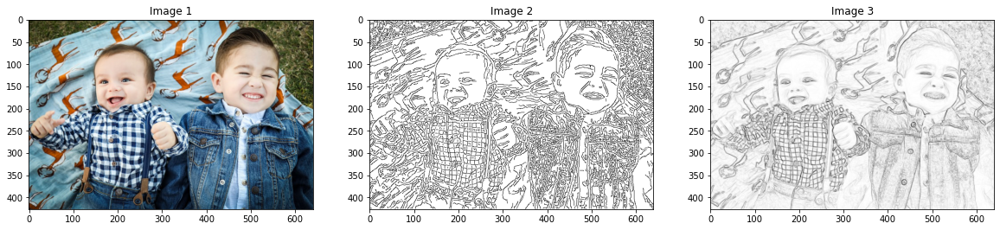

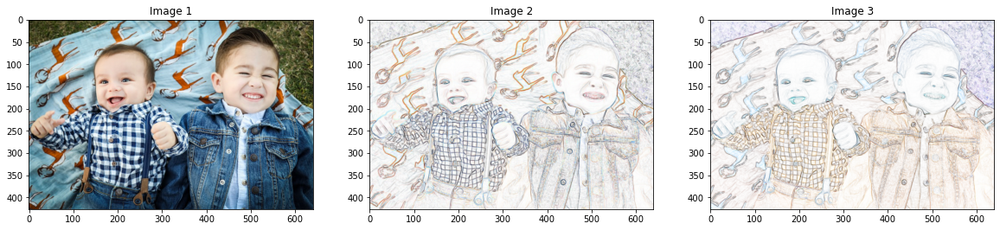

In [18]:
# Edge Detection on Gray Image
ShowThreeImages(image_color, edge_detection_gray(image_color, filter='canny'), edge_detection_gray(image_color, filter='sobel'))

# Edge Detection on Color Image
image_sobel_rgb, image_sobel_hsv = edge_detection_color(image_color)
ShowThreeImages(image_color, image_sobel_rgb, image_sobel_hsv)

**Tìm chọn range màu lower và upper để trích xuất được các khuôn mặt trong ảnh màu.**

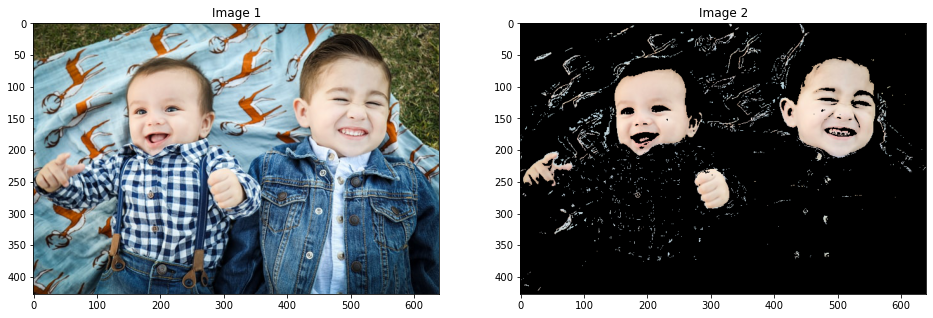

In [19]:
# Get color by range color in RGB from [178,152,136] to [255,235,220]
lower = [178,152,136]
upper = [255,235,220]
ShowTwoImages(image_color, get_color_in_range(image_color, lower, upper))

## Bài tập 3
**Chọn một bức ảnh từ internet về 1 đồ vật và thực hiện các thao tác sau**


Image Size: (427, 640, 3)


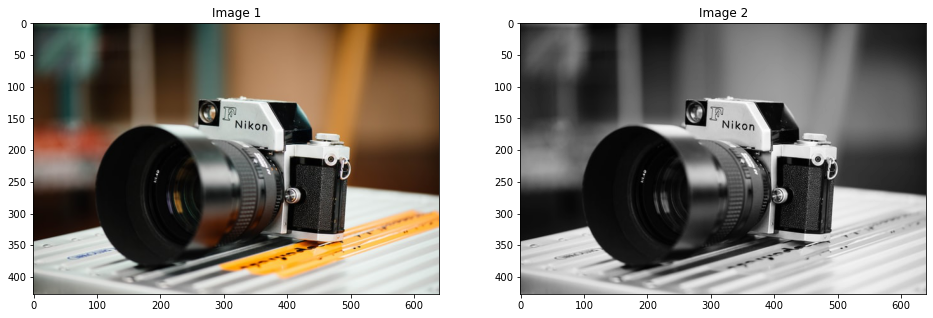

In [20]:
# Read Image
image_color, image_gray = read_image("camera.jpg")[:2]
# Display Image
print("Image Size:", image_color.shape)
ShowTwoImages(image_color, image_gray)

**Xuất ảnh xoay các góc 30, 45, 60 độ.**

In [21]:
def rotate_image(src_img, angle):
    return (rotate(src_img, angle, resize = True), rotate(src_img, angle))

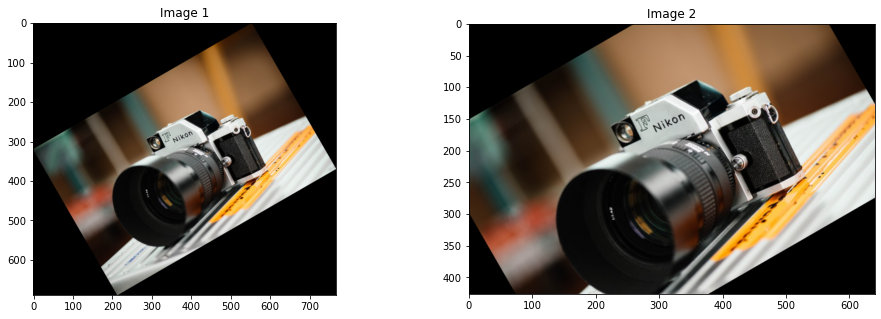

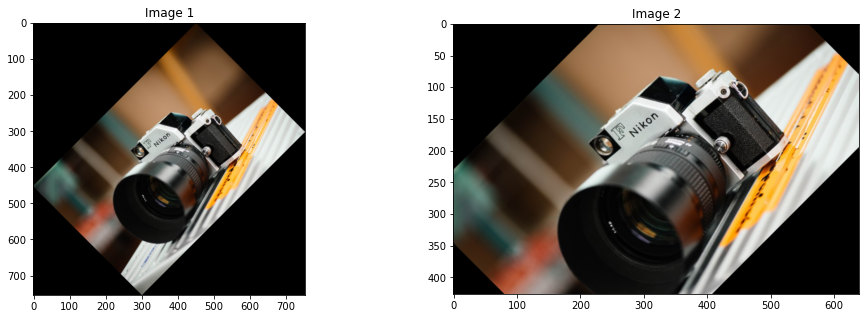

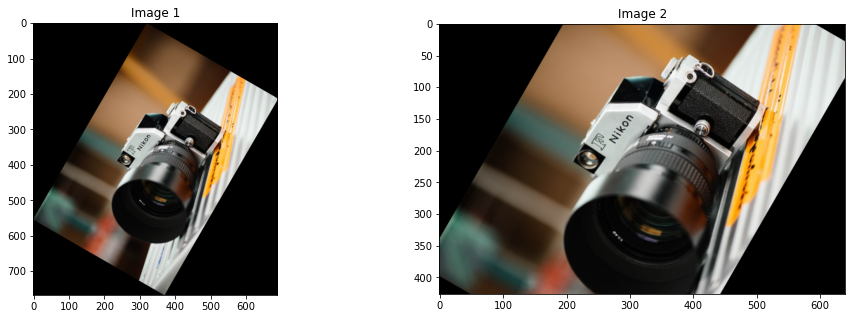

In [22]:
img_rotate_30_1, img_rotate_30_2 = rotate_image(image_color, 30)
img_rotate_45_1, img_rotate_45_2 = rotate_image(image_color, 45)
img_rotate_60_1, img_rotate_60_2 = rotate_image(image_color, 60)

ShowTwoImages(img_rotate_30_1, img_rotate_30_2)
ShowTwoImages(img_rotate_45_1, img_rotate_45_2)
ShowTwoImages(img_rotate_60_1, img_rotate_60_2)

**Tự viết lại hàm quay ảnh**

In [23]:
def rotation_img(src_img, angle):
    angle = math.radians(angle)
    cosine = math.cos(angle)
    sine = math.sin(angle)
    h, w = src_img.shape[:2]
    output_img = np.zeros_like(src_img)
    original_center_height = round(((h + 1) / 2) - 1)
    original_center_width = round(((w + 1) / 2) - 1)
    for i in range(h):
        for j in range(w):
            y = i - original_center_height
            x = j - original_center_width
            new_y = round(-x * sine + y * cosine)
            new_x = round(x *cosine + y * sine)
            new_y += original_center_height
            new_x += original_center_width
            if 0 <= new_x < w and 0 <= new_y < h:
                output_img[new_y,new_x,:] = src_img[i,j,:]
    return output_img

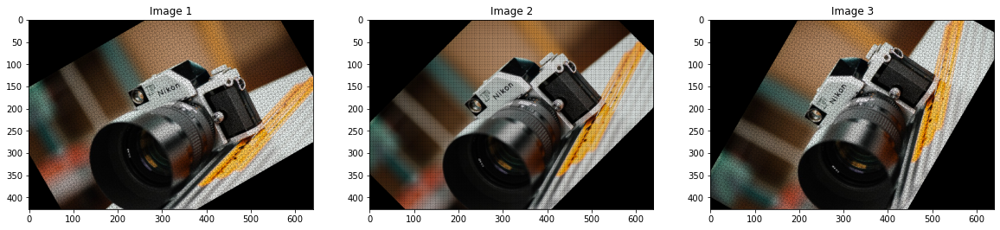

In [24]:
ShowThreeImages(rotation_img(image_color, 30), rotation_img(image_color, 45), rotation_img(image_color, 60))

**Xuất ảnh đối xứng qua trục hoành và trục tung đi qua tâm ảnh.**

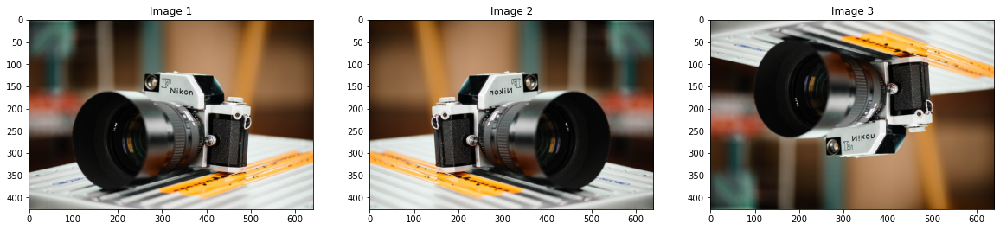

In [25]:
image_horizontal_flip = image_color[:, ::-1]
image_vertical_flip = image_color[::-1, :]

ShowThreeImages(image_color, image_horizontal_flip, image_vertical_flip)

**Xuất ảnh đối xứng qua trục bằng hàm tự viết.**

In [26]:
def flipping_img(src_img, flipcode = 1): 
    h, w = src_img.shape[:2]
    x_distance = w
    y_distance = h
    if flipcode == 0:
        ts_mat = np.array([[1, 0, 0], [0, -1, y_distance]])
    elif flipcode == 1:
        ts_mat = np.array([[-1, 0, x_distance], [0, 1, 0]])
    else:
        ts_mat = np.array([[-1, 0, x_distance], [0, -1, y_distance]])
    output_img = np.zeros(src_img.shape, dtype='u1')
    for i in range(h):
        for j in range(w):
            origin_x = j
            origin_y = i
            origin_xy = np.array([origin_x, origin_y, 1])
            new_xy = np.dot(ts_mat, origin_xy)
            new_x = new_xy[0]
            new_y = new_xy[1]
            if 0 <= new_x < w and 0 <= new_y < h:
                output_img[new_y, new_x] = src_img[i, j]
    return output_img

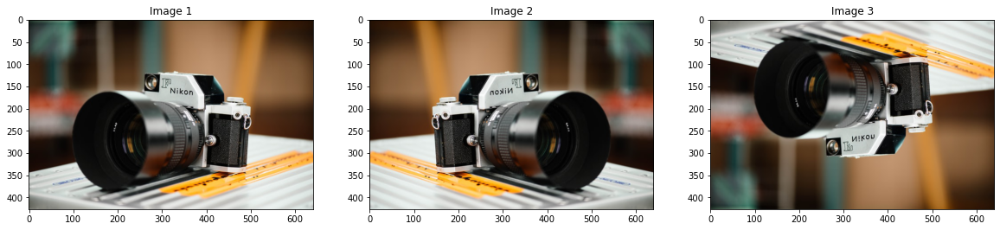

In [27]:
ShowThreeImages(image_color, flipping_img(image_color, 1), flipping_img(image_color, 0))

**Xuất ảnh inversion.**

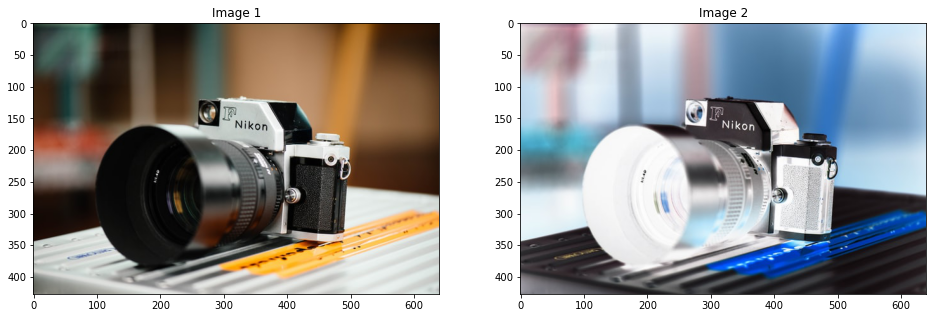

In [28]:
image_inversion = util.invert(image_color)
ShowTwoImages(image_color, image_inversion)

**Xuất ảnh enhance contrast.**

11.0 219.0


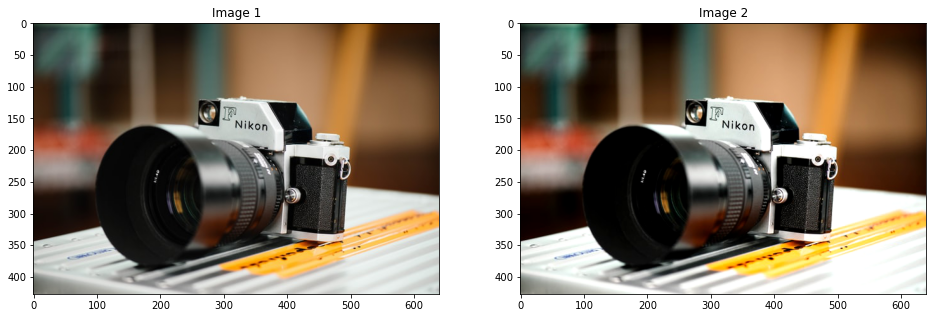

In [29]:
# take from 10 to 90 percent of color range
v_min, v_max = np.percentile(image_color, (10, 90))
better_contrast = exposure.rescale_intensity(image_color, in_range=(v_min, v_max))

print(v_min, v_max)
ShowTwoImages(image_color, better_contrast)

**Xuất ảnh gamma và log enhancement.**

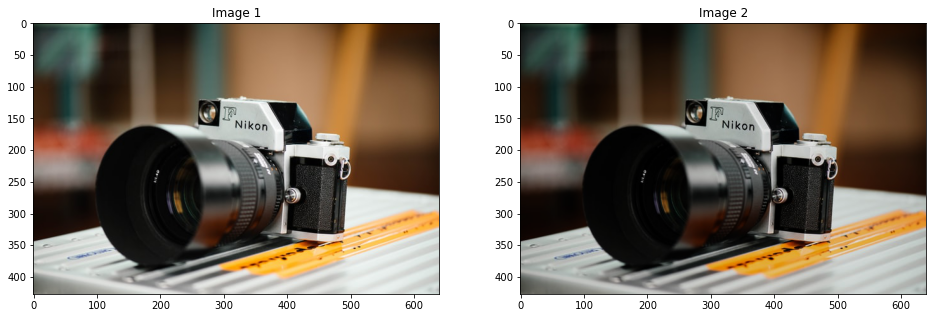

In [30]:
# gamma and gain parameters are between 0 and 1
adjusted_gamma_image = exposure.adjust_gamma(image_color, gamma=1.2, gain=0.9)
ShowTwoImages(image_color, adjusted_gamma_image)